# **Food/Fruit Recognition and Calorie Estimation**
## **Part D Binary Segmentation**

## **Importing Libraries**

In [ ]:
import os
import random
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
import tensorflow as tf
import time
# Standard Keras layers used in UNET, DeepLabV3, SegNet
from tensorflow.keras import layers, models, Input

print("done")

print(f"TensorFlow Version: {tf.__version__}")
print("Done")

2025-12-18 01:22:04.125653: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1766020924.536387      47 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1766020924.669722      47 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

done
TensorFlow Version: 2.18.0
Done


## **Configuration** 

In [2]:
ROOT_DIR = "/kaggle/input/cv-data/Project Data/Fruit"
TRAIN_DIR = os.path.join(ROOT_DIR, "Train")
VAL_DIR   = os.path.join(ROOT_DIR, "Validation")
OUT_DIR   = "/kaggle/working/seg_out"   # Kaggle writeable location

IMAGE_SIZE = (256, 256)
BATCH_SIZE = 16

os.makedirs(OUT_DIR, exist_ok=True)

print("Train dir exists?", os.path.exists(TRAIN_DIR))
print("Val   dir exists?", os.path.exists(VAL_DIR))

print("done")

Train dir exists? True
Val   dir exists? True
done


## **Loading the Data**

In [3]:
def get_file_pairs(base_dir):
    base = Path(base_dir)
    img_paths = []
    mask_paths = []
    
    all_images = sorted(list(base.glob("*/Images/*.*")))
    
    for img_path in all_images:
        parent = img_path.parent.parent 
        
        mask_dir = parent / "Mask"
        stem = img_path.stem
        
        candidates = [
            mask_dir / f"{stem}_mask.png",
            mask_dir / f"{stem}.png",
            mask_dir / f"{stem}_mask.jpg",
            mask_dir / f"{stem}.jpg"
        ]
        
        found_mask = next((c for c in candidates if c.exists()), None)
        
        if found_mask:
            img_paths.append(str(img_path))
            mask_paths.append(str(found_mask))
            
    return img_paths, mask_paths



## **PreProcessing**

In [4]:
def load_and_preprocess(img_path, mask_path):
    """
    TF-native loading and processing. Runs on the graph (potentially GPU).
    """
    img = tf.io.read_file(img_path)
    img = tf.io.decode_image(img, channels=3, expand_animations=False)
    img = tf.image.resize(img, IMAGE_SIZE)
    img = tf.cast(img, tf.float32) / 255.0  # Normalize [0,1]

    mask = tf.io.read_file(mask_path)
    mask = tf.io.decode_image(mask, channels=1, expand_animations=False)

    mask = tf.image.resize(mask, IMAGE_SIZE, method='nearest') 
    mask = tf.cast(mask, tf.float32) / 255.0
    mask = tf.cast(mask > 0.5, tf.float32) # Binarize strictly

    return img, mask

def create_tf_dataset(img_paths, mask_paths, training=False):
    """Wraps paths into a high-performance tf.data pipeline"""
    dataset = tf.data.Dataset.from_tensor_slices((img_paths, mask_paths))
    
    # Apply loading function in parallel
    dataset = dataset.map(load_and_preprocess, num_parallel_calls=tf.data.AUTOTUNE)
    
    if training:
        dataset = dataset.shuffle(buffer_size=1000)
    
    dataset = dataset.batch(BATCH_SIZE)
    dataset = dataset.prefetch(buffer_size=tf.data.AUTOTUNE) # Preload next batch
    return dataset

# --- Execution ---

# 1. Gather raw paths
train_img_paths, train_mask_paths = get_file_pairs(TRAIN_DIR)
val_img_paths, val_mask_paths = get_file_pairs(VAL_DIR)

# 2. Handle fallback split (same logic as your original code)
if len(val_img_paths) == 0 and len(train_img_paths) > 10:
    print("Validation empty. Splitting training data...")
    # Zip, shuffle, and unzip to keep images/masks aligned
    combined = list(zip(train_img_paths, train_mask_paths))
    random.shuffle(combined)
    train_img_paths, train_mask_paths = zip(*combined)
    
    split_idx = int(0.2 * len(combined))
    val_img_paths, val_mask_paths = train_img_paths[:split_idx], train_mask_paths[:split_idx]
    train_img_paths, train_mask_paths = train_img_paths[split_idx:], train_mask_paths[split_idx:]
    
    # Convert back to lists
    train_img_paths, train_mask_paths = list(train_img_paths), list(train_mask_paths)
    val_img_paths, val_mask_paths = list(val_img_paths), list(val_mask_paths)

print(f"Train samples: {len(train_img_paths)}")
print(f"Val samples:   {len(val_img_paths)}")

# 3. Create the final TensorFlow Datasets
train_ds = create_tf_dataset(train_img_paths, train_mask_paths, training=True)
val_ds = create_tf_dataset(val_img_paths, val_mask_paths, training=False)

print ("done")



def load_and_augment(img_path, mask_path):
    img, mask = load_and_preprocess(img_path, mask_path)

    if tf.random.uniform(()) > 0.5:
        img = tf.image.flip_left_right(img)
        mask = tf.image.flip_left_right(mask)

    if tf.random.uniform(()) > 0.5:
        img = tf.image.flip_up_down(img)
        mask = tf.image.flip_up_down(mask)

    img = tf.image.random_brightness(img, max_delta=0.1)
    img = tf.image.random_contrast(img, lower=0.9, upper=1.1)
    
    return img, mask

if 'train_img_paths' not in globals() or 'val_img_paths' not in globals():
    print("Paths missing. Re-running file gathering...")
    train_img_paths, train_mask_paths = get_file_pairs(TRAIN_DIR)
    val_img_paths, val_mask_paths = get_file_pairs(VAL_DIR)


print(f"Creating datasets from {len(train_img_paths)} training images...")

train_ds = tf.data.Dataset.from_tensor_slices((train_img_paths, train_mask_paths))
train_ds = train_ds.map(load_and_augment, num_parallel_calls=tf.data.AUTOTUNE)
train_ds = train_ds.shuffle(1000).batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)

val_ds = create_tf_dataset(val_img_paths, val_mask_paths, training=False)

print("Success: 'train_ds' and 'val_ds' are ready.")

Train samples: 1759
Val samples:   150
done


I0000 00:00:1766021270.558467      47 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13942 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5
I0000 00:00:1766021270.559258      47 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 13942 MB memory:  -> device: 1, name: Tesla T4, pci bus id: 0000:00:05.0, compute capability: 7.5


## **Loss Matricies**

In [6]:
#Loss Matricies
def dice_loss(y_true, y_pred):
    smooth = 1e-6
    y_true_f = tf.reshape(y_true, [-1])
    y_pred_f = tf.reshape(y_pred, [-1])
    intersection = tf.reduce_sum(y_true_f * y_pred_f)
    dice = (2. * intersection + smooth) / (tf.reduce_sum(y_true_f) + tf.reduce_sum(y_pred_f) + smooth)
    return 1 - dice

def combined_loss(y_true, y_pred):
    bce = tf.keras.losses.binary_crossentropy(y_true, y_pred)
    dice = dice_loss(y_true, y_pred)
    return bce + (2.0 * dice)

def iou_score(y_true, y_pred):
    smooth = 1e-6
    # Threshold predictions to be strict 0 or 1
    y_pred_thresholded = tf.cast(y_pred > 0.5, tf.float32)
    
    y_true_f = tf.reshape(y_true, [-1])
    y_pred_f = tf.reshape(y_pred_thresholded, [-1])
    
    intersection = tf.reduce_sum(y_true_f * y_pred_f)
    union = tf.reduce_sum(y_true_f) + tf.reduce_sum(y_pred_f) - intersection
    return (intersection + smooth) / (union + smooth)


## **Models**

### **Model 1 - U-Net**

In [11]:
def iou_score(y_true, y_pred):
    smooth = 1e-6
    y_true_f = tf.reshape(y_true, [-1])
    y_pred_f = tf.reshape(y_pred, [-1])
    intersection = tf.reduce_sum(y_true_f * y_pred_f)
    union = tf.reduce_sum(y_true_f) + tf.reduce_sum(y_pred_f) - intersection
    return (intersection + smooth) / (union + smooth)


def conv_block(inputs, filters):
    """
    Equivalent to your 'DoubleConv' class.
    Two convolutions, each followed by Batch Normalization and ReLU.
    """
    x = layers.Conv2D(filters, 3, padding="same", use_bias=False)(inputs)
    x = layers.BatchNormalization()(x)
    x = layers.Activation("relu")(x)
    
    x = layers.Conv2D(filters, 3, padding="same", use_bias=False)(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation("relu")(x)
    return x

def build_unet_small(input_shape=(256, 256, 3), num_classes=1):
    """
    Replicates the 'UNetSmall' architecture depth and connections.
    """
    inputs = layers.Input(shape=input_shape)

    # --- Encoder (Downsampling) ---
    # Block 1
    c1 = conv_block(inputs, 32)
    p1 = layers.MaxPooling2D((2, 2))(c1)

    # Block 2
    c2 = conv_block(p1, 64)
    p2 = layers.MaxPooling2D((2, 2))(c2)

    # Block 3 (Bottleneck)
    c3 = conv_block(p2, 128)
    
    # --- Decoder (Upsampling) ---
    # Up 1 (matches c2)
    u1 = layers.UpSampling2D((2, 2), interpolation="bilinear")(c3)
    u1 = layers.Concatenate()([u1, c2])
    c4 = conv_block(u1, 64)
    
    # Up 2 (matches c1)
    u2 = layers.UpSampling2D((2, 2), interpolation="bilinear")(c4)
    u2 = layers.Concatenate()([u2, c1])
    c5 = conv_block(u2, 32)

    # --- Output Layer ---
    # Use Sigmoid for binary classification (0 to 1)
    outputs = layers.Conv2D(num_classes, 1, activation="sigmoid")(c5)

    return models.Model(inputs, outputs, name="U-Net_Small")

# --- 2. Instantiate and Compile ---

# Clear any previous models from memory
tf.keras.backend.clear_session()

unet_model = build_unet_small(input_shape=(256, 256, 3))

unet_model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-2),
    loss=tf.keras.losses.BinaryCrossentropy(),
    metrics=['accuracy', iou_score] # We use the iou_score defined in Cell 2
)

unet_model.summary()

# --- 3. Train (Fit) ---

print("\nStarting U-Net Training...")

# Define callbacks (like saving the best model)
checkpoint_path = os.path.join(OUT_DIR, "unet_small_best.keras")
callbacks = [
    tf.keras.callbacks.ModelCheckpoint(
        checkpoint_path,
        save_best_only=True,
        monitor='val_iou_score', # Monitors the validation IoU
        mode='max',
        verbose=1
    ),
]

history_unet = unet_model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=10, # Increase this number for real training (e.g., 20-50)
    callbacks=callbacks,
    verbose=1
)

# --- 4. Save History ---
import json
# Convert history values to float (standard float32 is not JSON serializable)
history_dict = {k: [float(v) for v in vals] for k, vals in history_unet.history.items()}
with open(os.path.join(OUT_DIR, "history_unet.json"), "w") as f:
    json.dump(history_dict, f)

print(f"UNet training complete. Model saved to: {checkpoint_path}")

Model: "U-Net_Small"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 256, 256,  │        864 │ input_layer[0][0] │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 256, 256,  │        128 │ conv2d[0][0]      │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation          │ (None, 256, 256,  │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 256, 256,  │      9,216 │ activation[0][0]  │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 256, 256,  │        128 │ conv2d_1[0][0]    │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_1        │ (None, 256, 256,  │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 128, 128,  │          0 │ activation_1[0][… │
│ (MaxPooling2D)      │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 128, 128,  │     18,432 │ max_pooling2d[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        256 │ conv2d_2[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_2        │ (None, 128, 128,  │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 128, 128,  │     36,864 │ activation_2[0][… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        256 │ conv2d_3[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_3        │ (None, 128, 128,  │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_1     │ (None, 64, 64,    │          0 │ activation_3[0][… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 64, 64,    │     73,728 │ max_pooling2d_1[… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 64, 64,    │        512 │ conv2d_4[0][0]  

 Total params: 473,473 (1.81 MB)

 Trainable params: 472,193 (1.80 MB)

 Non-trainable params: 1,280 (5.00 KB)


Starting U-Net Training...
Epoch 1/10


I0000 00:00:1766022862.873944     112 service.cc:148] XLA service 0x78ce5c10bfe0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1766022862.875780     112 service.cc:156]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1766022862.875805     112 service.cc:156]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5
I0000 00:00:1766022863.903712     112 cuda_dnn.cc:529] Loaded cuDNN version 90300
2025-12-18 01:54:45.443121: E external/local_xla/xla/service/slow_operation_alarm.cc:65] Trying algorithm eng0{} for conv (f32[32,96,3,3]{3,2,1,0}, u8[0]{0}) custom-call(f32[16,96,256,256]{3,2,1,0}, f32[16,32,256,256]{3,2,1,0}), window={size=3x3 pad=1_1x1_1}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBackwardFilter", backend_config={"cudnn_conv_backend_config":{"activation_mode":"kNone","conv_result_scale":1,"leakyrelu_alpha":0,"side_input_scale":0},"force_earliest_schedule":false,"operation_qu

109/110 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step - accuracy: 0.8918 - iou_score: 0.6478 - loss: 0.2512

2025-12-18 01:55:41.753710: E external/local_xla/xla/service/slow_operation_alarm.cc:65] Trying algorithm eng0{} for conv (f32[32,96,3,3]{3,2,1,0}, u8[0]{0}) custom-call(f32[15,96,256,256]{3,2,1,0}, f32[15,32,256,256]{3,2,1,0}), window={size=3x3 pad=1_1x1_1}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBackwardFilter", backend_config={"cudnn_conv_backend_config":{"activation_mode":"kNone","conv_result_scale":1,"leakyrelu_alpha":0,"side_input_scale":0},"force_earliest_schedule":false,"operation_queue_id":"0","wait_on_operation_queues":[]} is taking a while...
2025-12-18 01:55:42.429463: E external/local_xla/xla/service/slow_operation_alarm.cc:133] The operation took 1.675859643s
Trying algorithm eng0{} for conv (f32[32,96,3,3]{3,2,1,0}, u8[0]{0}) custom-call(f32[15,96,256,256]{3,2,1,0}, f32[15,32,256,256]{3,2,1,0}), window={size=3x3 pad=1_1x1_1}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBackwardFilter", backend_config={"cudnn_conv_backend_config":{"act

110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 510ms/step - accuracy: 0.8921 - iou_score: 0.6483 - loss: 0.2507
Epoch 1: val_iou_score improved from -inf to 0.61611, saving model to /kaggle/working/seg_out/unet_small_best.keras
110/110 ━━━━━━━━━━━━━━━━━━━━ 103s 570ms/step - accuracy: 0.8923 - iou_score: 0.6488 - loss: 0.2503 - val_accuracy: 0.7901 - val_iou_score: 0.6161 - val_loss: 0.4179
Epoch 2/10
110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step - accuracy: 0.9347 - iou_score: 0.7452 - loss: 0.1609
Epoch 2: val_iou_score did not improve from 0.61611
110/110 ━━━━━━━━━━━━━━━━━━━━ 39s 311ms/step - accuracy: 0.9347 - iou_score: 0.7451 - loss: 0.1610 - val_accuracy: 0.4332 - val_iou_score: 0.4418 - val_loss: 0.7761
Epoch 3/10
110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step - accuracy: 0.9422 - iou_score: 0.7623 - loss: 0.1503
Epoch 3: val_iou_score did not improve from 0.61611
110/110 ━━━━━━━━━━━━━━━━━━━━ 38s 306ms/step - accuracy: 0.9422 - iou_score: 0.7622 - loss: 0.1504 - val_accuracy: 0.3793 - val_iou_score: 

Visualizing 1 image from these folders: ['Apple_Gala', 'Apple_Golden Delicious', 'Avocado', 'Banana', 'Berry', 'Burmese Grape', 'Carambola', 'Date Palm', 'Dragon', 'Elephant Apple', 'Grape', 'Green Coconut', 'Guava', 'Hog Plum', 'Kiwi']


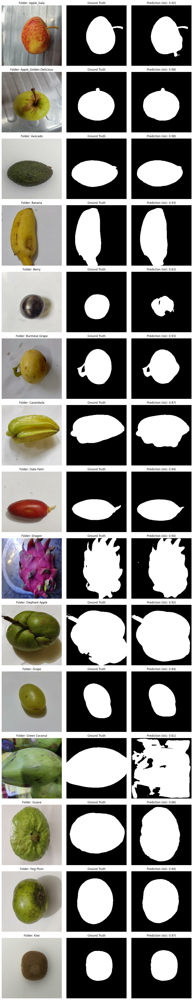

In [13]:
def visualize_per_folder(model, img_paths, mask_paths, num_samples=5):
    # 1. Find unique folders and pick one image from each
    folder_samples = {}
    
    for img_p, mask_p in zip(img_paths, mask_paths):
        category = Path(img_p).parent.parent.name
        if category not in folder_samples:
            folder_samples[category] = (img_p, mask_p)
        if len(folder_samples) >= num_samples:
            break
    
    if len(folder_samples) == 0:
        print("No folders found to visualize!")
        return

    print(f"Visualizing 1 image from these folders: {list(folder_samples.keys())}")

    # 2. Process images
    images_list = []
    masks_list = []
    labels = []

    for cat_name, (img_p, mask_p) in folder_samples.items():
        img, mask = load_and_preprocess(img_p, mask_p)
        images_list.append(img)
        masks_list.append(mask)
        labels.append(cat_name)

    batch_imgs = tf.stack(images_list)
    batch_masks = tf.stack(masks_list)

    # 3. Predict
    preds = model.predict(batch_imgs, verbose=0)

    # 4. Plot
    plt.figure(figsize=(12, 4 * len(batch_imgs)))
    
    for i in range(len(batch_imgs)):
        # -- Column 1: Original Image --
        plt.subplot(len(batch_imgs), 3, i*3 + 1)
        plt.imshow(batch_imgs[i])
        plt.title(f"Folder: {labels[i]}")
        plt.axis("off")
        
        # -- Column 2: True Mask --
        plt.subplot(len(batch_imgs), 3, i*3 + 2)
        plt.imshow(batch_masks[i, :, :, 0], cmap='gray')
        plt.title("Ground Truth")
        plt.axis("off")
        
        # -- Column 3: Prediction --
        plt.subplot(len(batch_imgs), 3, i*3 + 3)
        plt.imshow(preds[i, :, :, 0] > 0.5, cmap='gray')
        
        # --- FIX IS HERE ---
        # 1. Create the binary prediction (True/False)
        binary_pred = preds[i] > 0.5
        # 2. Cast it to Float32 (1.0/0.0) so math works
        binary_pred_float = tf.cast(binary_pred, tf.float32)
        
        score = iou_score(batch_masks[i], binary_pred_float)
        plt.title(f"Prediction (IoU: {score:.2f})")
        plt.axis("off")
            
    plt.tight_layout()
    plt.show()

# Run again
visualize_per_folder(unet_model, val_img_paths, val_mask_paths, num_samples=15)

### **Model 2 - DeepLabV3**

In [19]:
# --- 1. Define DeepLabV3 Components ---

def aspp_block(x, filters, rate):
    """
    Atrous Spatial Pyramid Pooling layer.
    'rate' > 1 allows the filter to see a wider area without losing resolution.
    """
    x = layers.Conv2D(filters, 3, padding="same", dilation_rate=rate, use_bias=False)(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation("relu")(x)
    return x

def build_deeplabv3_plus(input_shape=(256, 256, 3), num_classes=1):
    inputs = layers.Input(shape=input_shape)

    # --- Encoder (ResNet-like Backbone) ---
    # Standard convolutions to extract features
    x = layers.Conv2D(32, 3, strides=2, padding="same", use_bias=False)(inputs) # 128x128
    x = layers.BatchNormalization()(x)
    x = layers.Activation("relu")(x)
    
    x = layers.Conv2D(64, 3, padding="same", use_bias=False)(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation("relu")(x)
    
    # Downsample to 64x64
    x = layers.Conv2D(128, 3, strides=2, padding="same", use_bias=False)(x) 
    x = layers.BatchNormalization()(x)
    x = layers.Activation("relu")(x)
    
    # Downsample to 32x32 (We save this for the Decoder!)
    x = layers.Conv2D(256, 3, strides=2, padding="same", use_bias=False)(x) 
    x = layers.BatchNormalization()(x)
    low_level_features = x 

    # Bottleneck (Downsample to 16x16)
    x = layers.Conv2D(512, 3, strides=2, padding="same", use_bias=False)(x) 
    x = layers.BatchNormalization()(x)
    x = layers.Activation("relu")(x)

    # --- ASPP Module (The "DeepLab" Magic) ---
    # Branch 0: 1x1 Conv
    b0 = layers.Conv2D(256, 1, padding="same", use_bias=False)(x)
    b0 = layers.BatchNormalization()(b0)
    b0 = layers.Activation("relu")(b0)

    # Branches 1-3: Dilated Convolutions (See bigger context)
    b1 = aspp_block(x, 256, rate=6)
    b2 = aspp_block(x, 256, rate=12)
    b3 = aspp_block(x, 256, rate=18)

    # Branch 4: Global Pooling (See the whole image context)
    b4 = layers.GlobalAveragePooling2D()(x)
    b4 = layers.Reshape((1, 1, 512))(b4)
    b4 = layers.Conv2D(256, 1, padding="same", use_bias=False)(b4)
    b4 = layers.BatchNormalization()(b4)
    b4 = layers.Activation("relu")(b4)
    b4 = layers.UpSampling2D(size=(16, 16), interpolation="bilinear")(b4)

    # Concatenate all ASPP branches
    x = layers.Concatenate()([b0, b1, b2, b3, b4])
    x = layers.Conv2D(256, 1, padding="same", use_bias=False)(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation("relu")(x)

    # --- Decoder (The "Plus" in DeepLabV3+) ---
    # Upsample by 4 to match low_level_features (16x16 -> 32x32? No, need 2x upsample here)
    x = layers.UpSampling2D(size=(2, 2), interpolation="bilinear")(x) 
    
    # 1x1 Conv on Low Level Features to reduce channels
    low_level = layers.Conv2D(48, 1, padding="same", use_bias=False)(low_level_features)
    low_level = layers.BatchNormalization()(low_level)
    low_level = layers.Activation("relu")(low_level)

    # Combine High-Level (ASPP) and Low-Level features
    x = layers.Concatenate()([x, low_level])
    
    # Final Refinement
    x = layers.Conv2D(256, 3, padding="same", use_bias=False)(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation("relu")(x)
    
    x = layers.Conv2D(256, 3, padding="same", use_bias=False)(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation("relu")(x)

    # Final Upsample to original size (32 -> 256, factor of 8)
    x = layers.UpSampling2D(size=(8, 8), interpolation="bilinear")(x)
    
    # Output
    outputs = layers.Conv2D(num_classes, 1, activation="sigmoid")(x)

    return models.Model(inputs, outputs, name="DeepLabV3_Plus")

# --- 2. Train DeepLab ---

tf.keras.backend.clear_session()

deeplab_model = build_deeplabv3_plus(input_shape=(256, 256, 3))

# IMPORTANT: Use the same settings that worked for U-Net
# - Learning Rate: 1e-4 (Critical for stability)
# - Loss: combined_loss (Critical for class imbalance)
deeplab_model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4), 
    loss=combined_loss, 
    metrics=['accuracy', iou_score]
)

print("\nStarting DeepLabV3+ Training...")

# Use a separate checkpoint file
dl_checkpoint = os.path.join(OUT_DIR, "deeplab_best.keras")

dl_callbacks = [
    tf.keras.callbacks.ModelCheckpoint(dl_checkpoint, save_best_only=True, monitor='val_iou_score', mode='max', verbose=1),
    tf.keras.callbacks.ReduceLROnPlateau(monitor='val_iou_score', factor=0.5, patience=3, verbose=1)
]
start_time = time.time()
history_deeplab = deeplab_model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=40, # Run for at least 20 epochs to see benefits over U-Net
    callbacks=dl_callbacks,
    verbose=1
)
end_time = time.time()
total_training_time_seconds = end_time - start_time
minutes = int(total_training_time_seconds // 60)
seconds = int(total_training_time_seconds % 60)

# Save history
import json
history_dict_dl = {k: [float(v) for v in vals] for k, vals in history_deeplab.history.items()}
with open(os.path.join(OUT_DIR, "history_deeplab.json"), "w") as f:
    json.dump(history_dict_dl, f)

print(f"DeepLabV3+ training complete. Model saved to: {dl_checkpoint}")

print("--------------------------------------------------")
print(f"✅ Training Finished. Model saved to DeepLabV3.keras")
print(f"⏱️ Total Training Time: {minutes} minutes and {seconds} seconds ({total_training_time_seconds:.2f} seconds)")
print("--------------------------------------------------")


Starting DeepLabV3+ Training...
Epoch 1/40
110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step - accuracy: 0.9168 - iou_score: 0.8126 - loss: 0.4939
Epoch 1: val_iou_score improved from -inf to 0.00000, saving model to /kaggle/working/seg_out/deeplab_best.keras
110/110 ━━━━━━━━━━━━━━━━━━━━ 64s 424ms/step - accuracy: 0.9170 - iou_score: 0.8130 - loss: 0.4926 - val_accuracy: 0.6471 - val_iou_score: 3.1927e-12 - val_loss: 2.9915 - learning_rate: 1.0000e-04
Epoch 2/40
110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step - accuracy: 0.9614 - iou_score: 0.8887 - loss: 0.2588
Epoch 2: val_iou_score improved from 0.00000 to 0.00056, saving model to /kaggle/working/seg_out/deeplab_best.keras
110/110 ━━━━━━━━━━━━━━━━━━━━ 42s 338ms/step - accuracy: 0.9614 - iou_score: 0.8888 - loss: 0.2586 - val_accuracy: 0.6472 - val_iou_score: 5.5936e-04 - val_loss: 3.3687 - learning_rate: 1.0000e-04
Epoch 3/40
110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step - accuracy: 0.9685 - iou_score: 0.9086 - loss: 0.2102
Epoch 3: val_iou_score

--- DeepLabV3+ Results ---
Visualizing 1 image from these folders: ['Apple_Gala', 'Apple_Golden Delicious', 'Avocado', 'Banana', 'Berry', 'Burmese Grape', 'Carambola', 'Date Palm', 'Dragon', 'Elephant Apple', 'Grape', 'Green Coconut', 'Guava', 'Hog Plum', 'Kiwi', 'Lichi', 'Malta', 'Mango Golden Queen', 'Mango_Alphonso', 'Mango_Amrapali', 'Mango_Bari', 'Mango_Himsagar', 'Olive', 'Orange', 'Palm', 'Persimmon', 'Pineapple', 'Pomegranate', 'Watermelon', 'White Pear']


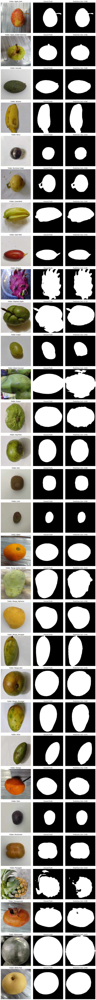

In [20]:
def visualize_per_folder(model, img_paths, mask_paths, num_samples=5):
    # 1. Find unique folders and pick one image from each
    folder_samples = {}
    
    for img_p, mask_p in zip(img_paths, mask_paths):
        category = Path(img_p).parent.parent.name
        if category not in folder_samples:
            folder_samples[category] = (img_p, mask_p)
        if len(folder_samples) >= num_samples:
            break
    
    if len(folder_samples) == 0:
        print("No folders found to visualize!")
        return

    print(f"Visualizing 1 image from these folders: {list(folder_samples.keys())}")

    # 2. Process images
    images_list = []
    masks_list = []
    labels = []

    for cat_name, (img_p, mask_p) in folder_samples.items():
        img, mask = load_and_preprocess(img_p, mask_p)
        images_list.append(img)
        masks_list.append(mask)
        labels.append(cat_name)

    batch_imgs = tf.stack(images_list)
    batch_masks = tf.stack(masks_list)

    # 3. Predict
    preds = model.predict(batch_imgs, verbose=0)

    # 4. Plot
    plt.figure(figsize=(12, 4 * len(batch_imgs)))
    
    for i in range(len(batch_imgs)):
        # -- Column 1: Original Image --
        plt.subplot(len(batch_imgs), 3, i*3 + 1)
        plt.imshow(batch_imgs[i])
        plt.title(f"Folder: {labels[i]}")
        plt.axis("off")
        
        # -- Column 2: True Mask --
        plt.subplot(len(batch_imgs), 3, i*3 + 2)
        plt.imshow(batch_masks[i, :, :, 0], cmap='gray')
        plt.title("Ground Truth")
        plt.axis("off")
        
        # -- Column 3: Prediction --
        plt.subplot(len(batch_imgs), 3, i*3 + 3)
        plt.imshow(preds[i, :, :, 0] > 0.5, cmap='gray')
        
        # --- FIX IS HERE ---
        # 1. Create the binary prediction (True/False)
        binary_pred = preds[i] > 0.5
        # 2. Cast it to Float32 (1.0/0.0) so math works
        binary_pred_float = tf.cast(binary_pred, tf.float32)
        
        score = iou_score(batch_masks[i], binary_pred_float)
        plt.title(f"Prediction (IoU: {score:.2f})")
        plt.axis("off")
            
    plt.tight_layout()
    plt.show()


print("--- DeepLabV3+ Results ---")
visualize_per_folder(deeplab_model, val_img_paths, val_mask_paths, num_samples=30)

### **Model 3 - SimpleSegNet**

In [22]:
# --- Define SegNet Architecture ---

def segnet_encoder_block(x, filters):
    x = layers.Conv2D(filters, 3, padding="same", use_bias=False)(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation("relu")(x)
    x = layers.Conv2D(filters, 3, padding="same", use_bias=False)(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation("relu")(x)
    x = layers.MaxPooling2D(pool_size=(2, 2))(x)
    return x

def segnet_decoder_block(x, filters):
    x = layers.UpSampling2D(size=(2, 2), interpolation='bilinear')(x) # Upsample first
    x = layers.Conv2D(filters, 3, padding="same", use_bias=False)(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation("relu")(x)
    x = layers.Conv2D(filters, 3, padding="same", use_bias=False)(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation("relu")(x)
    return x

def build_segnet(input_shape=(256, 256, 3), num_classes=1):
    inputs = layers.Input(shape=input_shape)

    # --- ENCODER (Downsampling) ---
    # Block 1
    x = segnet_encoder_block(inputs, 64)
    
    # Block 2
    x = segnet_encoder_block(x, 128)
    
    # Block 3
    x = segnet_encoder_block(x, 256)
    
    # Block 4 (Bottleneck)
    x = segnet_encoder_block(x, 512)

    # --- DECODER (Upsampling) ---
    # Note: No skip connections (Concatenate) here! That's the difference.
    
    # Up 4 (Matches Block 4)
    x = segnet_decoder_block(x, 512)
    
    # Up 3 (Matches Block 3)
    x = segnet_decoder_block(x, 256)
    
    # Up 2 (Matches Block 2)
    x = segnet_decoder_block(x, 128)
    
    # Up 1 (Matches Block 1)
    x = segnet_decoder_block(x, 64)

    # Output Layer
    outputs = layers.Conv2D(num_classes, 1, activation="sigmoid")(x)

    return models.Model(inputs, outputs, name="SegNet")

# --- 3. Train SegNet ---

tf.keras.backend.clear_session()

segnet_model = build_segnet(input_shape=(256, 256, 3))

segnet_model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4), 
    loss=combined_loss, 
    metrics=['accuracy', iou_score]
)

print("\nStarting SegNet Training...")
sn_checkpoint = os.path.join(OUT_DIR, "segnet_best.keras")

sn_callbacks = [
    tf.keras.callbacks.ModelCheckpoint(sn_checkpoint, save_best_only=True, monitor='val_iou_score', mode='max', verbose=1),
    tf.keras.callbacks.ReduceLROnPlateau(monitor='val_iou_score', factor=0.5, patience=3, verbose=1)
]
start_time = time.time()
history_segnet = segnet_model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=35, 
    callbacks=sn_callbacks,
    verbose=1
)

end_time = time.time()

total_training_time_seconds = end_time - start_time
minutes = int(total_training_time_seconds // 60)
seconds = int(total_training_time_seconds % 60)
# Save history
import json
history_dict_sn = {k: [float(v) for v in vals] for k, vals in history_segnet.history.items()}
with open(os.path.join(OUT_DIR, "history_segnet.json"), "w") as f:
    json.dump(history_dict_sn, f)

print(f"SegNet training complete. Model saved to: {sn_checkpoint}")
print("--------------------------------------------------")
print(f"✅ Training Finished. Model saved to SegNet.keras")
print(f"⏱️ Total Training Time: {minutes} minutes and {seconds} seconds ({total_training_time_seconds:.2f} seconds)")
print("--------------------------------------------------")


Starting SegNet Training...
Epoch 1/35
110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 823ms/step - accuracy: 0.9145 - iou_score: 0.7913 - loss: 0.6172
Epoch 1: val_iou_score improved from -inf to 0.00000, saving model to /kaggle/working/seg_out/segnet_best.keras
110/110 ━━━━━━━━━━━━━━━━━━━━ 115s 882ms/step - accuracy: 0.9147 - iou_score: 0.7918 - loss: 0.6155 - val_accuracy: 0.6471 - val_iou_score: 3.1927e-12 - val_loss: 2.6720 - learning_rate: 1.0000e-04
Epoch 2/35
110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 771ms/step - accuracy: 0.9582 - iou_score: 0.8817 - loss: 0.3138
Epoch 2: val_iou_score did not improve from 0.00000
110/110 ━━━━━━━━━━━━━━━━━━━━ 92s 795ms/step - accuracy: 0.9582 - iou_score: 0.8817 - loss: 0.3137 - val_accuracy: 0.6471 - val_iou_score: 3.1927e-12 - val_loss: 3.4534 - learning_rate: 1.0000e-04
Epoch 3/35
110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 780ms/step - accuracy: 0.9640 - iou_score: 0.8965 - loss: 0.2711
Epoch 3: val_iou_score improved from 0.00000 to 0.05320, saving model to /kaggle/working/s

--- SimpleSegNet Results ---
Visualizing 1 image from these folders: ['Apple_Gala', 'Apple_Golden Delicious', 'Avocado', 'Banana', 'Berry', 'Burmese Grape', 'Carambola', 'Date Palm', 'Dragon', 'Elephant Apple', 'Grape', 'Green Coconut', 'Guava', 'Hog Plum', 'Kiwi', 'Lichi', 'Malta', 'Mango Golden Queen', 'Mango_Alphonso', 'Mango_Amrapali', 'Mango_Bari', 'Mango_Himsagar', 'Olive', 'Orange', 'Palm', 'Persimmon', 'Pineapple', 'Pomegranate', 'Watermelon', 'White Pear']


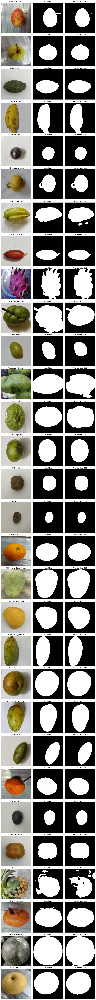

In [23]:
def visualize_per_folder(model, img_paths, mask_paths, num_samples=5):
    # 1. Find unique folders and pick one image from each
    folder_samples = {}
    
    for img_p, mask_p in zip(img_paths, mask_paths):
        category = Path(img_p).parent.parent.name
        if category not in folder_samples:
            folder_samples[category] = (img_p, mask_p)
        if len(folder_samples) >= num_samples:
            break
    
    if len(folder_samples) == 0:
        print("No folders found to visualize!")
        return

    print(f"Visualizing 1 image from these folders: {list(folder_samples.keys())}")

    # 2. Process images
    images_list = []
    masks_list = []
    labels = []

    for cat_name, (img_p, mask_p) in folder_samples.items():
        img, mask = load_and_preprocess(img_p, mask_p)
        images_list.append(img)
        masks_list.append(mask)
        labels.append(cat_name)

    batch_imgs = tf.stack(images_list)
    batch_masks = tf.stack(masks_list)

    # 3. Predict
    preds = model.predict(batch_imgs, verbose=0)

    # 4. Plot
    plt.figure(figsize=(12, 4 * len(batch_imgs)))
    
    for i in range(len(batch_imgs)):
        # -- Column 1: Original Image --
        plt.subplot(len(batch_imgs), 3, i*3 + 1)
        plt.imshow(batch_imgs[i])
        plt.title(f"Folder: {labels[i]}")
        plt.axis("off")
        
        # -- Column 2: True Mask --
        plt.subplot(len(batch_imgs), 3, i*3 + 2)
        plt.imshow(batch_masks[i, :, :, 0], cmap='gray')
        plt.title("Ground Truth")
        plt.axis("off")
        
        # -- Column 3: Prediction --
        plt.subplot(len(batch_imgs), 3, i*3 + 3)
        plt.imshow(preds[i, :, :, 0] > 0.5, cmap='gray')
        
        # --- FIX IS HERE ---
        # 1. Create the binary prediction (True/False)
        binary_pred = preds[i] > 0.5
        # 2. Cast it to Float32 (1.0/0.0) so math works
        binary_pred_float = tf.cast(binary_pred, tf.float32)
        
        score = iou_score(batch_masks[i], binary_pred_float)
        plt.title(f"Prediction (IoU: {score:.2f})")
        plt.axis("off")
            
    plt.tight_layout()
    plt.show()


print("--- SimpleSegNet Results ---")
visualize_per_folder(segnet_model, val_img_paths, val_mask_paths, num_samples=30)

# ***Prepared By Team 3***